In [1]:
import scanpy as sc 
import pandas as pd
import anndata 
import scanorama
import CococoNet_reader 
from scipy import sparse
import numpy as np

In [2]:
maize_cccnt = CococoNet_reader.read_cococonet('maize')
arabi_cccnt = CococoNet_reader.read_cococonet('arabidopsis')

In [3]:
maize_arab_map_one_to_one = pd.read_csv('/data/passala/Data_from_CoCoCoNet/One_to_one_mapping_from_cococonet/arabi_maize_one_one_converted_format.csv')
maize_arab_map_one_to_one = maize_arab_map_one_to_one.drop(columns = ['maize_OrthoID','arabidopsis_OrthoID'])
maize_arab_map_one_to_one = maize_arab_map_one_to_one.rename(columns = {'arabidopsis':'Arabidopsis Gene','maize':'Maize Gene'})
co_expressalog_map_85 = maize_arab_map_one_to_one
co_expressalog_map_85


,Arabidopsis Gene,Maize Gene
0,AT5G42760,Zm00001d034249
1,AT5G39940,Zm00001d031216
2,AT3G27230,Zm00001d036103
3,AT5G40830,Zm00001d036103
4,AT5G65740,Zm00001d013361
...,...,...
2721,AT1G70360,Zm00001d028296
2722,AT4G29690,Zm00001d039454
2723,AT4G29710,Zm00001d039454
2724,AT4G29700,Zm00001d039454


In [4]:
co_expressalog_map_85 = co_expressalog_map_85.drop_duplicates(subset = 'Maize Gene', keep = False)
co_expressalog_map_85 = co_expressalog_map_85.drop_duplicates(subset = 'Arabidopsis Gene', keep = False)
co_expressalog_map_85

,Arabidopsis Gene,Maize Gene
0,AT5G42760,Zm00001d034249
1,AT5G39940,Zm00001d031216
4,AT5G65740,Zm00001d013361
5,AT5G22130,Zm00001d005370
6,AT2G34200,Zm00001d011763
...,...,...
2705,AT5G04010,Zm00001d043190
2706,AT2G03800,Zm00001d036888
2707,AT3G07640,Zm00001d017000
2713,AT1G23390,Zm00001d043723


In [5]:
co_expressalog_map_85

,Arabidopsis Gene,Maize Gene
0,AT5G42760,Zm00001d034249
1,AT5G39940,Zm00001d031216
4,AT5G65740,Zm00001d013361
5,AT5G22130,Zm00001d005370
6,AT2G34200,Zm00001d011763
...,...,...
2705,AT5G04010,Zm00001d043190
2706,AT2G03800,Zm00001d036888
2707,AT3G07640,Zm00001d017000
2713,AT1G23390,Zm00001d043723


In [6]:
maize_Data = sc.read_10x_mtx('/data/passala/Collaborator_Data/GEO_sourced_single_cell_for_CRUSH/Maize_nitrate_root_SC/Cell_ranger_output_folder/Full_output/cells_with_nitrate/outs/filtered_feature_bc_matrix')

In [7]:
maize_Data.var['feature_types'].value_counts()

Gene Expression    46430
Name: feature_types, dtype: int64

In [8]:
arabidopsis_matrix_panda = pd.read_csv('/data/passala/Collaborator_Data/GEO_sourced_single_cell_for_CRUSH/Arabidopsis/mol_plant_paper/annotated_from_github/norm_data_arabidopsis.csv')

In [9]:
arabidopsis_matrix_panda

,AAACCTGAGAATTCCC,AAACCTGAGGGCACTA,AAACCTGAGTAATCCC,AAACCTGAGTACGTTC,AAACCTGAGTATTGGA,AAACCTGCAAAGGAAG,AAACCTGCACTCAGGC,AAACCTGCATGCAATC,AAACCTGCATGGTTGT,AAACCTGCATTCTCAT,...,TTTGTCAAGTTCGCAT,TTTGTCAAGTTTGCGT,TTTGTCACAGGGCATA,TTTGTCACATTTCACT,TTTGTCAGTCAATGTC,TTTGTCATCAAGGCTT,TTTGTCATCCCACTTG,TTTGTCATCCTGCCAT,TTTGTCATCCTTCAAT,TTTGTCATCTCTGCTG
AT1G01010,0.00,0.00,0.0,1.41,0.00,0.00,0.00,0.96,0.0,0.00,...,0.27,0.00,0.00,0.00,1.23,0.0,0.0,0.00,1.68,0.93
AT1G01020,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,...,0.48,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00
AT1G01030,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00
AT1G01040,1.30,0.00,0.0,0.00,0.00,0.00,1.57,0.00,0.0,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00
AT1G01050,1.30,1.53,0.0,0.00,2.17,1.59,0.00,1.22,0.0,1.16,...,0.00,0.00,1.16,2.02,1.23,0.0,0.0,1.03,1.68,1.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATMG01350,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00
ATMG01360,1.85,0.00,0.0,0.00,0.00,0.00,0.00,0.59,0.0,0.00,...,0.48,1.81,0.00,0.00,0.00,0.0,0.0,0.00,0.00,1.97
ATMG01370,1.30,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00
ATMG01390,1.85,2.11,0.0,0.00,0.00,2.81,1.57,0.00,0.0,2.48,...,0.27,1.49,1.16,2.02,0.00,0.0,0.0,0.00,1.68,0.93


In [10]:
arabidopsis_matrix_panda = arabidopsis_matrix_panda.T
arabidopsis_matrix_panda

,AT1G01010,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,...,ATMG01200,ATMG01220,ATMG01280,ATMG01320,ATMG01330,ATMG01350,ATMG01360,ATMG01370,ATMG01390,ATMG01410
AAACCTGAGAATTCCC,0.00,0.0,0.0,1.3,1.30,1.30,0.00,0.0,1.30,3.11,...,0.0,0.0,0.0,0.0,0.0,0.0,1.85,1.3,1.85,0.0
AAACCTGAGGGCACTA,0.00,0.0,0.0,0.0,1.53,0.00,0.00,0.0,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,2.11,0.0
AAACCTGAGTAATCCC,0.00,0.0,0.0,0.0,0.00,1.62,0.00,0.0,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
AAACCTGAGTACGTTC,1.41,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,1.41,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
AAACCTGAGTATTGGA,0.00,0.0,0.0,0.0,2.17,0.00,0.00,0.0,0.00,1.82,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCAAGGCTT,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
TTTGTCATCCCACTTG,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,1.26,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
TTTGTCATCCTGCCAT,0.00,0.0,0.0,0.0,1.03,0.00,0.00,0.0,0.00,2.30,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
TTTGTCATCCTTCAAT,1.68,0.0,0.0,0.0,1.68,0.00,0.00,0.0,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,1.68,0.0


In [11]:
arabidopsis_sc = anndata.AnnData(X = arabidopsis_matrix_panda.values, obs = arabidopsis_matrix_panda.index.to_list(), var = arabidopsis_matrix_panda.columns.to_list())
arabidopsis_sc

/tmp/ipykernel_951308/1248425317.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  arabidopsis_sc = anndata.AnnData(X = arabidopsis_matrix_panda.values, obs = arabidopsis_matrix_panda.index.to_list(), var = arabidopsis_matrix_panda.columns.to_list())


AnnData object with n_obs × n_vars = 7695 × 23161
    obs: 0
    var: 0

In [12]:
arabidopsis_sc.var.columns = ['Gene Name']
arabidopsis_sc.var = arabidopsis_sc.var.reindex(arabidopsis_sc.var['Gene Name'])
arabidopsis_sc.obs.columns = ['Barcode']
arabidopsis_sc.obs = arabidopsis_sc.obs.reindex(arabidopsis_sc.obs['Barcode'])

In [13]:
arabidopsis_sc.var['In CoCoCoNet'] = 0
arabidopsis_sc.var['In CoCoCoNet'].loc[arabidopsis_sc.var.index.isin(arabi_cccnt.index)] = 1
arabidopsis_sc = arabidopsis_sc[:,arabidopsis_sc.var['In CoCoCoNet'] == 1]
arabidopsis_sc

/tmp/ipykernel_951308/1318293783.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arabidopsis_sc.var['In CoCoCoNet'].loc[arabidopsis_sc.var.index.isin(arabi_cccnt.index)] = 1


View of AnnData object with n_obs × n_vars = 7695 × 19895
    obs: 'Barcode'
    var: 'Gene Name', 'In CoCoCoNet'

In [14]:
maize_Data.var['In CoCoCoNet'] = 0
maize_Data.var['In CoCoCoNet'].loc[maize_Data.var['gene_ids'].isin(maize_cccnt.index)] = 1
maize_Data = maize_Data[:,maize_Data.var['In CoCoCoNet'] == 1]
maize_Data

/tmp/ipykernel_951308/104753113.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maize_Data.var['In CoCoCoNet'].loc[maize_Data.var['gene_ids'].isin(maize_cccnt.index)] = 1


View of AnnData object with n_obs × n_vars = 4101 × 25955
    var: 'gene_ids', 'feature_types', 'In CoCoCoNet'

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


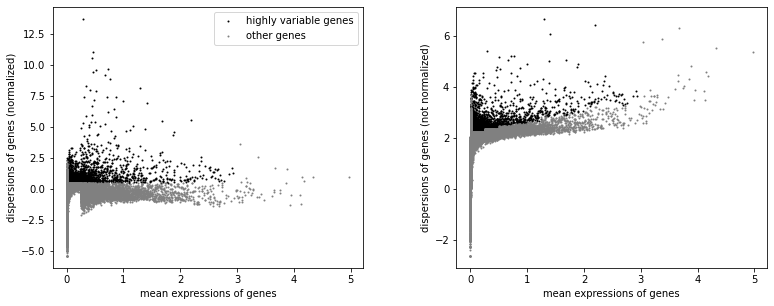

In [15]:
sc.pp.normalize_total(maize_Data, target_sum=1e4)
sc.pp.log1p(maize_Data)

sc.pp.highly_variable_genes(maize_Data, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(maize_Data)


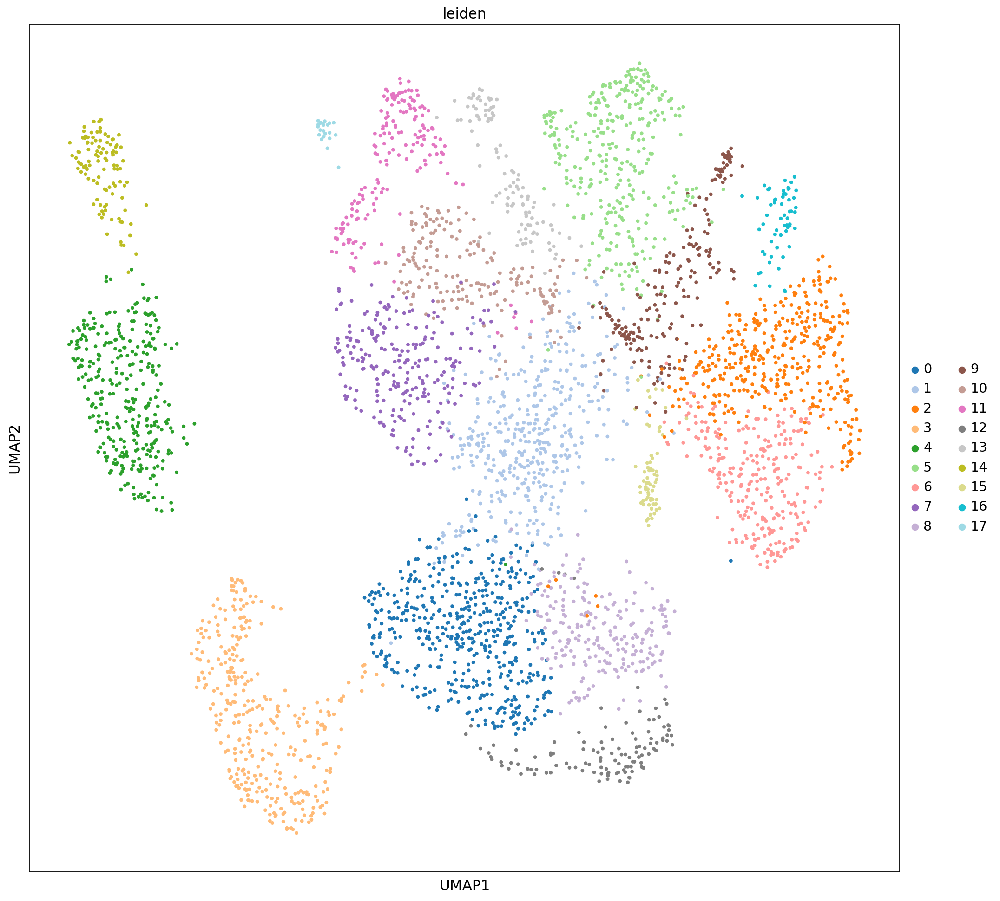

In [16]:
#maize_Data.raw = maize_Data
sc.set_figure_params(facecolor = 'white', figsize = (15,15))
sc.tl.pca(maize_Data, svd_solver='arpack', random_state= 200)
sc.pp.neighbors(maize_Data, n_neighbors=30, n_pcs=50, random_state= 500)
sc.tl.umap(maize_Data, random_state= 221)
sc.tl.leiden(maize_Data, random_state= 1000)

sc.pl.umap(maize_Data, color = 'leiden',palette= 'tab20', s=50)

In [17]:
maize_Data.obs['Cell Cluster Annotation'] = 'Not Annotatoed'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'] == '4'] = 'Epidermis'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'] == '14'] = 'Root Hair'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['8','0','1','7','10', '12', '3'])] = 'Cortex'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['9','5','13'])] = 'Phloem'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['2','6', '15'])] = 'Stele'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['17','11'])] = 'Meristematic'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'] == '16'] = 'Stele'




/tmp/ipykernel_951308/2911869250.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'] == '4'] = 'Epidermis'
/tmp/ipykernel_951308/2911869250.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'] == '14'] = 'Root Hair'
/tmp/ipykernel_951308/2911869250.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

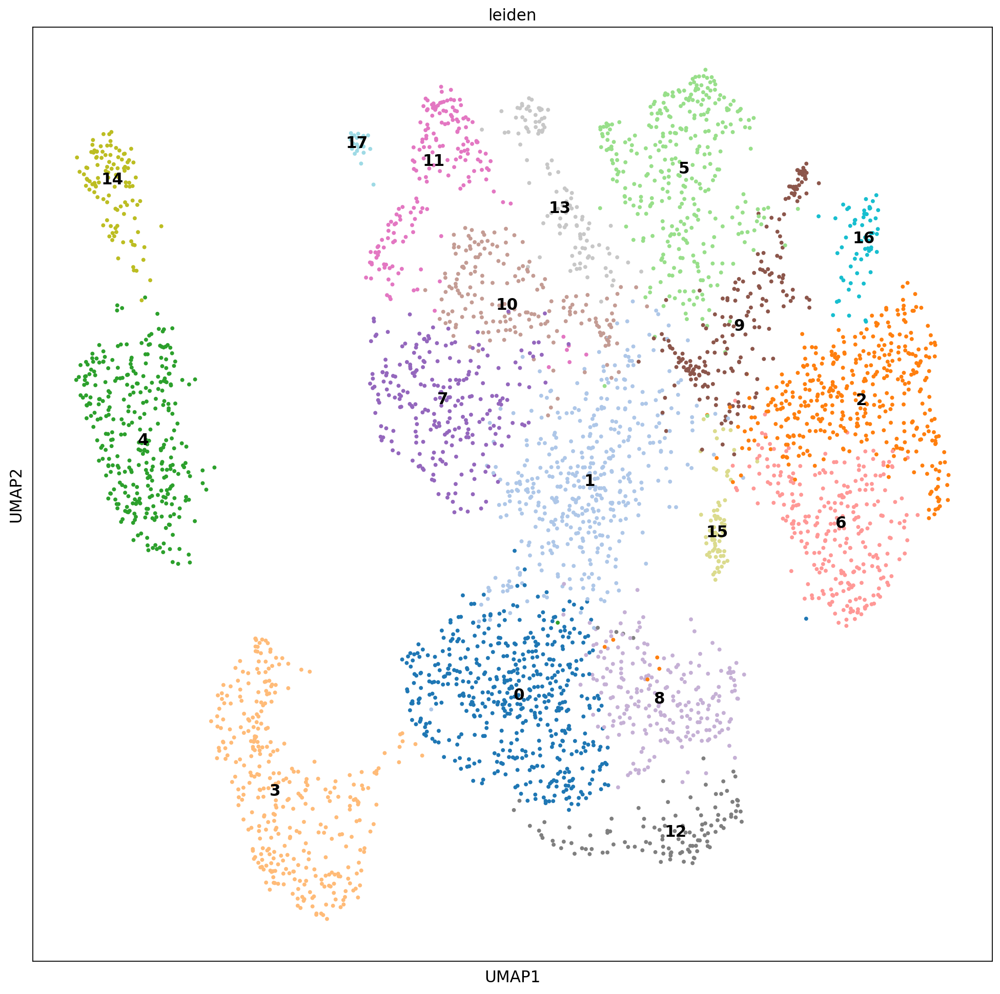

In [18]:
sc.pl.umap(maize_Data, color = 'leiden',palette= 'tab20', s=50, legend_loc = 'on data')

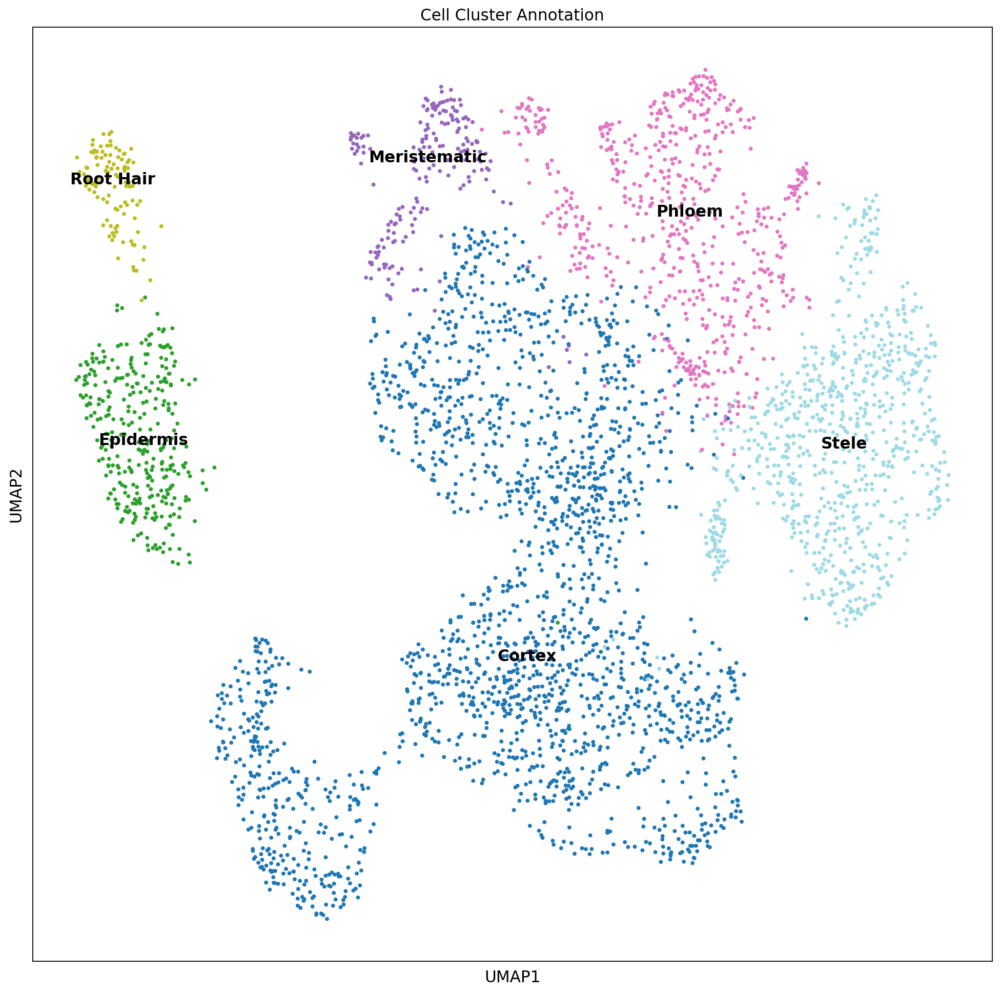

In [19]:
sc.pl.umap(maize_Data, color = 'Cell Cluster Annotation',palette= 'tab20', s=50, legend_loc = 'on data')

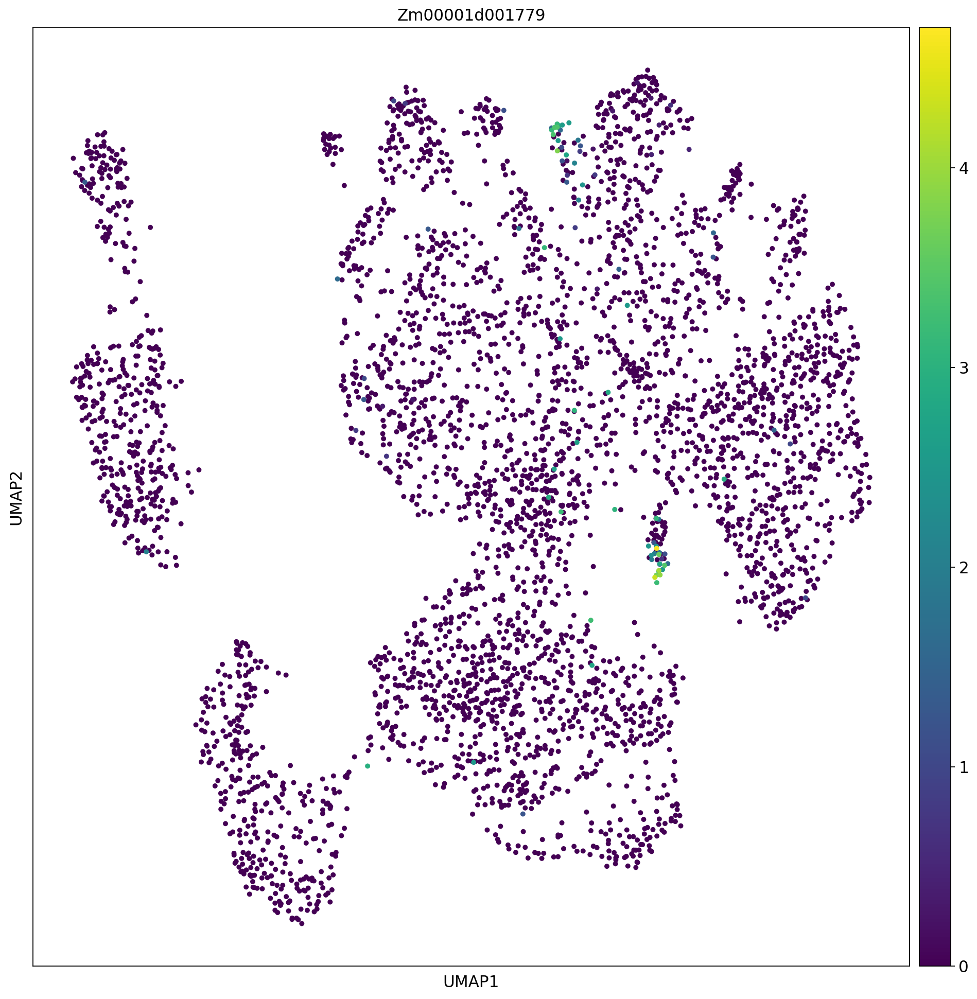

In [20]:
#sc.pl.umap(maize_Data, color =['leiden', 'Zm00001d049541'] ,palette= 'tab20', s=50)
sc.pl.umap(maize_Data, color ='Zm00001d001779' , s=80)

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


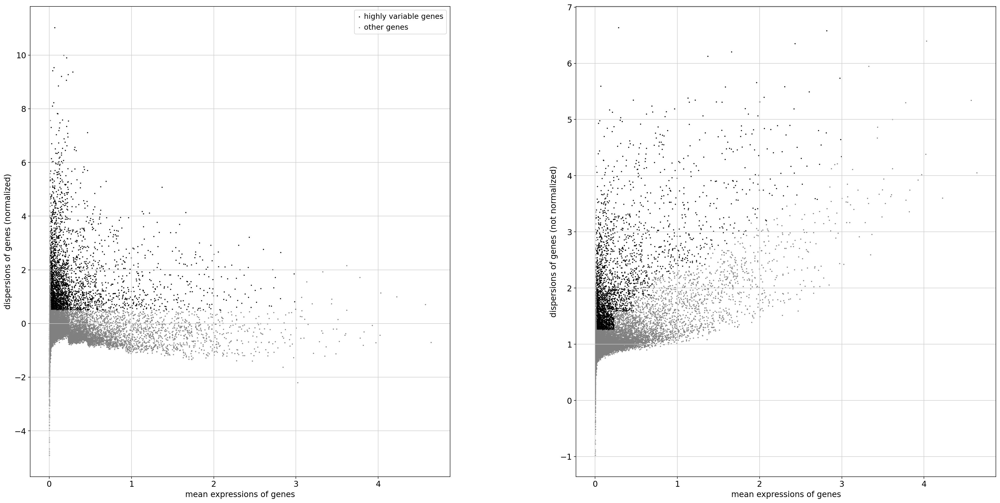

In [21]:
sc.pp.highly_variable_genes(arabidopsis_sc, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(arabidopsis_sc)



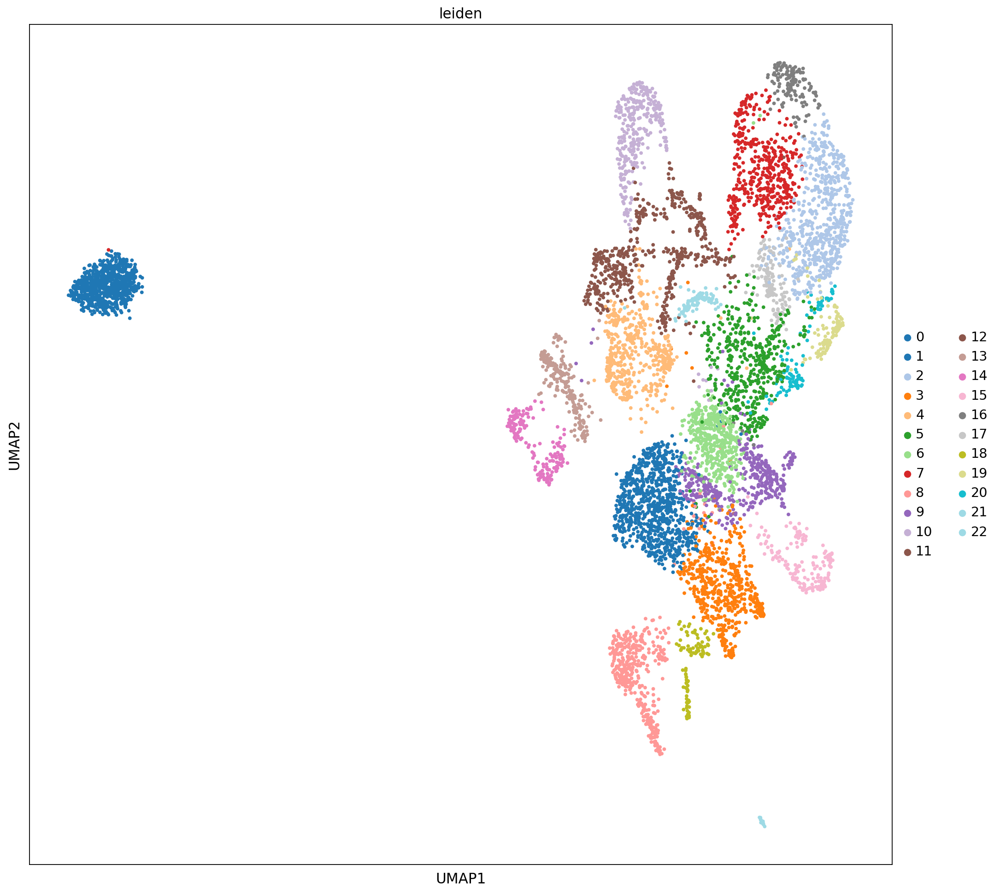

In [22]:
sc.tl.pca(arabidopsis_sc, svd_solver='arpack', random_state= 321)
sc.pp.neighbors(arabidopsis_sc, n_neighbors=20, n_pcs=50, random_state= 75)
sc.tl.umap(arabidopsis_sc, random_state= 267)
sc.tl.leiden(arabidopsis_sc, random_state= 143)

sc.pl.umap(arabidopsis_sc, color = 'leiden',palette= 'tab20', s=50)

In [23]:
umap_df = pd.DataFrame(data = arabidopsis_sc.obsm['X_umap'], columns = ['Axis 1','Axis 2'], index = arabidopsis_sc.obs.index)
umap_df

,Axis 1,Axis 2
Barcode,,
AAACCTGAGAATTCCC,12.415882,6.083405
AAACCTGAGGGCACTA,-20.025967,7.689164
AAACCTGAGTAATCCC,6.506667,12.040573
AAACCTGAGTACGTTC,7.306907,9.832688
AAACCTGAGTATTGGA,10.820136,3.016051
...,...,...
TTTGTCATCAAGGCTT,9.603496,3.542099
TTTGTCATCCCACTTG,7.082306,-5.105612
TTTGTCATCCTGCCAT,11.558331,5.043017


In [24]:
umap_df['Axis 1'].sort_values().head(831)

Barcode
CGCTTCAGTTCCCTTG   -22.373665
ACCTTTACATACAGCT   -22.273302
CGCGGTAGTCATATGC   -22.259459
CCGTGGAAGATATACG   -22.230085
GACGTGCAGGCTACGA   -22.223192
                      ...    
CCCATACCATAGGATA   -18.809650
TCAGCTCTCCTAGTGA   -18.730679
CTACGTCGTTCTGGTA   -18.653570
GATGCTAAGTGCCATT   -18.634516
TGCGTGGAGTGACATA   -18.633524
Name: Axis 1, Length: 831, dtype: float32

In [25]:
bad_values = umap_df.sort_values(by = 'Axis 1').head(831).index
good_obs = arabidopsis_sc.obs.loc[~arabidopsis_sc.obs.index.isin(bad_values)]
arabidopsis_sc  = arabidopsis_sc[good_obs.index,:]


/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


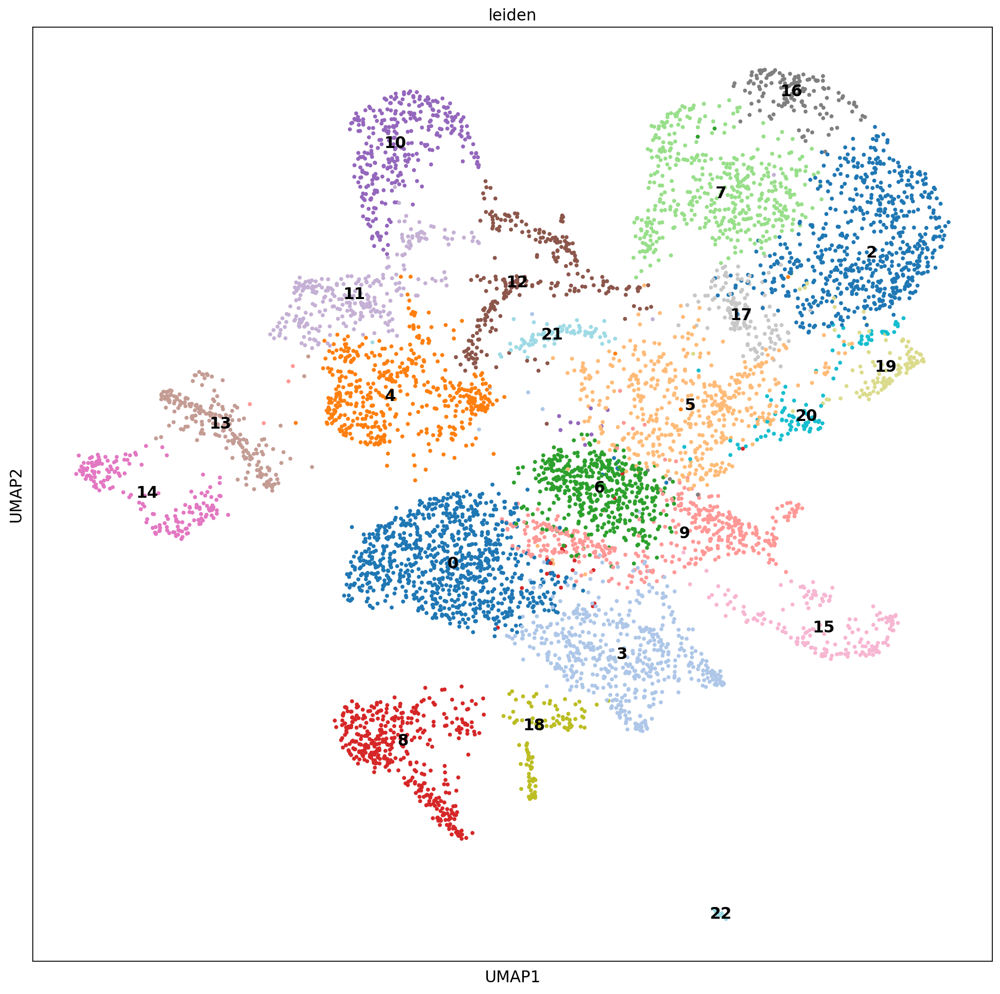

In [26]:
sc.pl.umap(arabidopsis_sc, color = 'leiden',palette= 'tab20', s=50, legend_loc= 'on data')

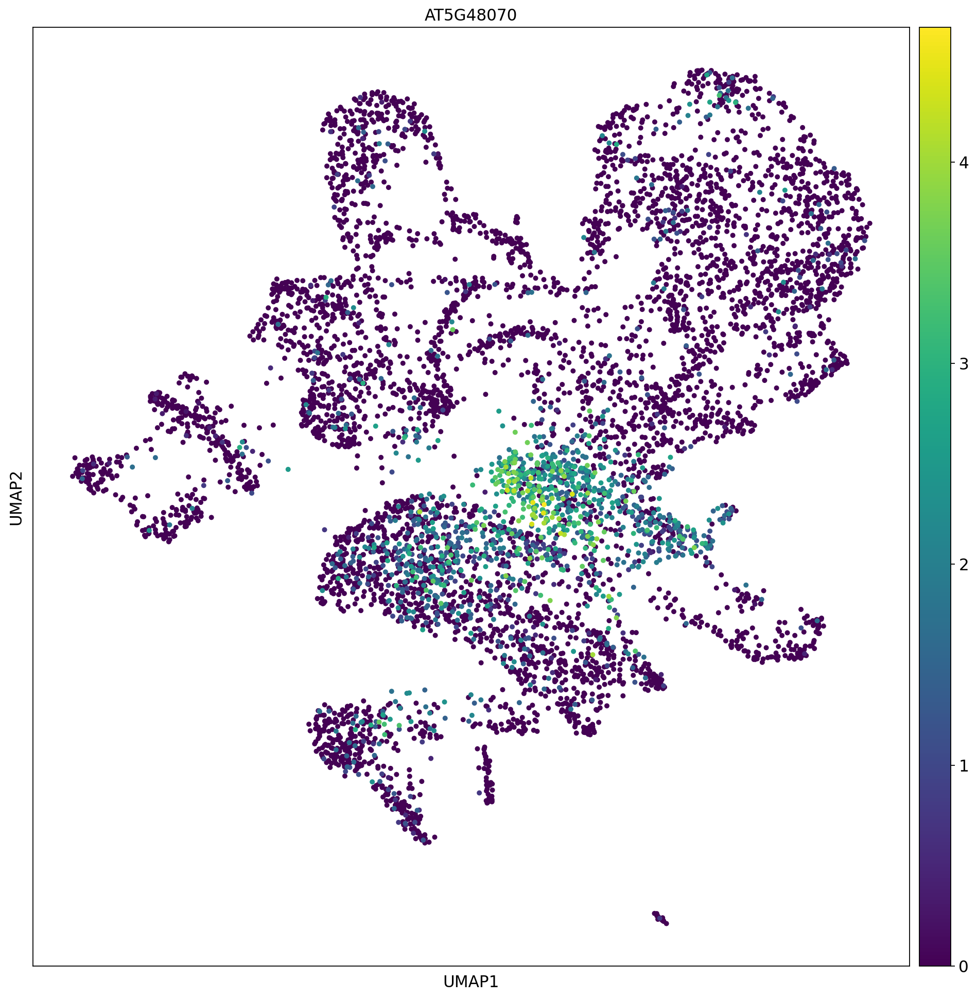

In [27]:
sc.pl.umap(arabidopsis_sc, color ='AT5G48070' , s=80)

In [28]:
types_to_include_in_mapping = ['Epidermis','Root Hair','Phloem','Stele','Meristematic']

In [29]:
arabidopsis_sc.obs['Cell Cluster Annotation'] = 'Not Annotatoed'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['19', '2'])] = 'Epidermis'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'] == '10'] = 'Root Hair'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['21'])] = 'Cortex'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['0','8','18'])] = 'Phloem'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['6','15', '9','13','14','15'])] = 'Stele'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['5','17','20'])] = 'Meristematic'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['3','4','7','11','12','16','22'])] = 'Unknown/Not Used For Combination'


/tmp/ipykernel_951308/23983124.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['19', '2'])] = 'Epidermis'
/tmp/ipykernel_951308/23983124.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'] == '10'] = 'Root Hair'
/tmp/ipykernel_951308/23983124.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning

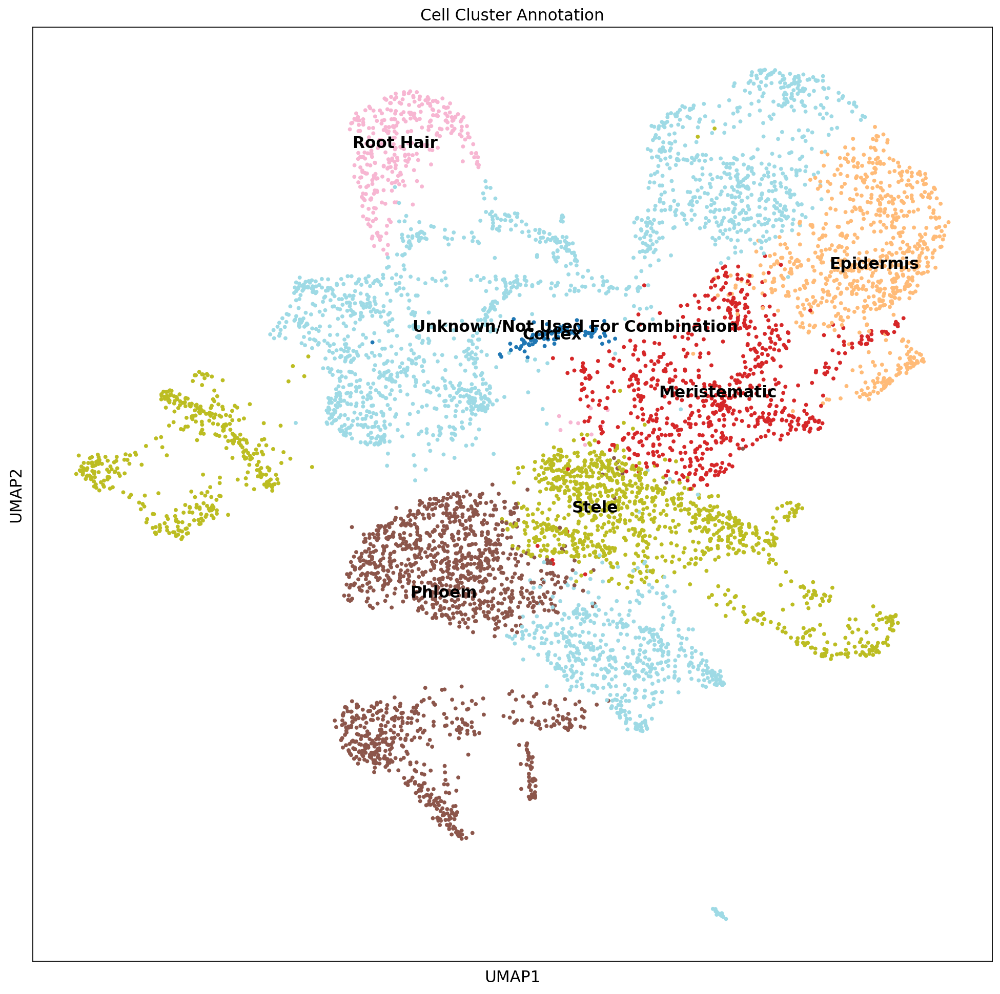

In [30]:
sc.pl.umap(arabidopsis_sc, color = 'Cell Cluster Annotation',palette= 'tab20', s=50, legend_loc = 'on data')

In [31]:
arabidopsis_sc.var['Gene Name'] = arabidopsis_sc.var.index
arabidopsis_sc.var = arabidopsis_sc.var.rename(columns = {'Gene Name':'Gene ID'})
arabidopsis_sc.var = arabidopsis_sc.var.merge(right = co_expressalog_map_85, right_on = 'Arabidopsis Gene', how = 'left', left_on= 'Gene ID')
arabidopsis_sc.var

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


,Gene ID,In CoCoCoNet,highly_variable,means,dispersions,dispersions_norm,Arabidopsis Gene,Maize Gene
0,AT1G01020,1,False,0.201025,0.910928,-0.333120,NaN,NaN
1,AT1G01030,1,False,0.022766,1.057569,0.022509,NaN,NaN
2,AT1G01040,1,False,0.057645,0.975395,-0.176779,NaN,NaN
3,AT1G01050,1,False,1.237518,1.313468,-0.853014,NaN,NaN
4,AT1G01060,1,False,0.209817,1.143889,0.231849,NaN,NaN
...,...,...,...,...,...,...,...,...
19890,ATMG01350,1,False,0.001509,1.258547,0.509914,NaN,NaN
19891,ATMG01360,1,False,0.515715,1.118924,-0.567870,NaN,NaN
19892,ATMG01370,1,False,0.037064,1.036257,-0.029178,NaN,NaN
19893,ATMG01390,1,False,1.062062,2.020124,0.102415,NaN,NaN


In [32]:
arabidopsis_sc.var = arabidopsis_sc.var.set_index('Gene ID')
arabidopsis_sc.var

,In CoCoCoNet,highly_variable,means,dispersions,dispersions_norm,Arabidopsis Gene,Maize Gene
Gene ID,,,,,,,
AT1G01020,1,False,0.201025,0.910928,-0.333120,NaN,NaN
AT1G01030,1,False,0.022766,1.057569,0.022509,NaN,NaN
AT1G01040,1,False,0.057645,0.975395,-0.176779,NaN,NaN
AT1G01050,1,False,1.237518,1.313468,-0.853014,NaN,NaN
AT1G01060,1,False,0.209817,1.143889,0.231849,NaN,NaN
...,...,...,...,...,...,...,...
ATMG01350,1,False,0.001509,1.258547,0.509914,NaN,NaN
ATMG01360,1,False,0.515715,1.118924,-0.567870,NaN,NaN
ATMG01370,1,False,0.037064,1.036257,-0.029178,NaN,NaN


In [33]:
maize_Data

AnnData object with n_obs × n_vars = 4101 × 25955
    obs: 'leiden', 'Cell Cluster Annotation'
    var: 'gene_ids', 'feature_types', 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [34]:
maize_Data.var.merge(right = co_expressalog_map_85, how = 'left', right_on= 'Maize Gene', left_on='gene_ids')

,gene_ids,feature_types,In CoCoCoNet,highly_variable,means,dispersions,dispersions_norm,Arabidopsis Gene,Maize Gene
0,Zm00001d027231,Gene Expression,1,False,2.520810e-01,2.164560,-0.380041,NaN,NaN
1,Zm00001d027232,Gene Expression,1,False,1.000000e-12,NaN,0.000000,NaN,NaN
2,Zm00001d027233,Gene Expression,1,False,6.043349e-04,0.223102,-1.953361,NaN,NaN
3,Zm00001d027236,Gene Expression,1,False,2.388622e-02,2.239849,0.489377,NaN,NaN
4,Zm00001d027239,Gene Expression,1,False,2.744667e-02,2.052797,0.262814,NaN,NaN
...,...,...,...,...,...,...,...,...,...
25950,ENSRNA049479090,Gene Expression,1,True,8.779240e-02,2.556639,0.873081,NaN,NaN
25951,ENSRNA049478822,Gene Expression,1,True,5.090141e-01,2.678254,1.157485,NaN,NaN
25952,ENSRNA049478534,Gene Expression,1,True,9.616010e-02,2.586654,0.909436,NaN,NaN
25953,ENSRNA049478530,Gene Expression,1,True,3.340918e-01,2.660385,1.780093,NaN,NaN


In [35]:
maize_Data.var = maize_Data.var.merge(right = co_expressalog_map_85, how = 'left', right_on= 'Maize Gene', left_on='gene_ids')
maize_Data.var

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


,gene_ids,feature_types,In CoCoCoNet,highly_variable,means,dispersions,dispersions_norm,Arabidopsis Gene,Maize Gene
0,Zm00001d027231,Gene Expression,1,False,2.520810e-01,2.164560,-0.380041,NaN,NaN
1,Zm00001d027232,Gene Expression,1,False,1.000000e-12,NaN,0.000000,NaN,NaN
2,Zm00001d027233,Gene Expression,1,False,6.043349e-04,0.223102,-1.953361,NaN,NaN
3,Zm00001d027236,Gene Expression,1,False,2.388622e-02,2.239849,0.489377,NaN,NaN
4,Zm00001d027239,Gene Expression,1,False,2.744667e-02,2.052797,0.262814,NaN,NaN
...,...,...,...,...,...,...,...,...,...
25950,ENSRNA049479090,Gene Expression,1,True,8.779240e-02,2.556639,0.873081,NaN,NaN
25951,ENSRNA049478822,Gene Expression,1,True,5.090141e-01,2.678254,1.157485,NaN,NaN
25952,ENSRNA049478534,Gene Expression,1,True,9.616010e-02,2.586654,0.909436,NaN,NaN
25953,ENSRNA049478530,Gene Expression,1,True,3.340918e-01,2.660385,1.780093,NaN,NaN


In [36]:
arabi_var_names_with_ortholog = arabidopsis_sc.var.dropna().index
arabi_version_of_maize_genes_with_ortholog = maize_Data.var.dropna()['Arabidopsis Gene'].to_list()

arabi_var_names_with_ortholog
overlap_of_shared_genes = arabi_var_names_with_ortholog.intersection(arabi_version_of_maize_genes_with_ortholog)

maize_genes_to_keep = maize_Data.var.loc[maize_Data.var['Arabidopsis Gene'].isin(overlap_of_shared_genes)].index

In [37]:
maize_Data.var = maize_Data.var.set_index('gene_ids')


In [38]:
maize_genes_to_keep

Int64Index([   14,    22,    58,    69,    72,    89,    94,   102,   103,
              134,
            ...
            25635, 25662, 25712, 25722, 25731, 25734, 25756, 25757, 25796,
            25890],
           dtype='int64', length=1289)

In [39]:
maize_single_cell_trimmed_to_orthologs = maize_Data[:,maize_genes_to_keep]
maize_single_cell_trimmed_to_orthologs

View of AnnData object with n_obs × n_vars = 4101 × 1289
    obs: 'leiden', 'Cell Cluster Annotation'
    var: 'feature_types', 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Arabidopsis Gene', 'Maize Gene'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [40]:
arabi_single_cell_slimmed_to_orthologs = arabidopsis_sc[:,overlap_of_shared_genes]
arabi_single_cell_slimmed_to_orthologs

View of AnnData object with n_obs × n_vars = 6864 × 1289
    obs: 'Barcode', 'leiden', 'Cell Cluster Annotation'
    var: 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Arabidopsis Gene', 'Maize Gene'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [41]:
maize_single_cell_trimmed_to_orthologs.var.index = maize_single_cell_trimmed_to_orthologs.var['Arabidopsis Gene'].to_list()
maize_single_cell_trimmed_to_orthologs.var

,feature_types,In CoCoCoNet,highly_variable,means,dispersions,dispersions_norm,Arabidopsis Gene,Maize Gene
AT4G17610,Gene Expression,1,False,0.055275,2.062388,0.274431,AT4G17610,Zm00001d027259
AT5G61510,Gene Expression,1,True,0.127049,2.438514,0.730005,AT5G61510,Zm00001d027276
AT5G09860,Gene Expression,1,True,0.143544,2.409078,0.694351,AT5G09860,Zm00001d027324
AT2G40780,Gene Expression,1,False,0.066605,1.769463,-0.080367,AT2G40780,Zm00001d027339
AT3G46560,Gene Expression,1,False,0.926579,2.138089,-0.852361,AT3G46560,Zm00001d027342
...,...,...,...,...,...,...,...,...
AT5G64010,Gene Expression,1,False,0.078542,2.083584,0.300104,AT5G64010,Zm00001d026705
AT4G16970,Gene Expression,1,False,0.018696,1.932151,0.116685,AT4G16970,Zm00001d000034
AT4G17540,Gene Expression,1,True,0.025600,2.742499,1.098200,AT4G17540,Zm00001d000035
AT5G07400,Gene Expression,1,False,0.013882,1.821685,-0.017115,AT5G07400,Zm00001d000122


In [42]:
order_of_vars = arabi_single_cell_slimmed_to_orthologs.var.index.to_list()
current_order_maize_vars = maize_single_cell_trimmed_to_orthologs.var_names
panda_version_of_maize_x_data = pd.DataFrame(columns = current_order_maize_vars, data = maize_single_cell_trimmed_to_orthologs.X.todense())
re_ordered_version = panda_version_of_maize_x_data.reindex(columns = order_of_vars)
re_ordered_version = sparse.csr_matrix(re_ordered_version.values)
maize_single_cell_trimmed_to_orthologs.X = re_ordered_version
maize_single_cell_trimmed_to_orthologs.var = maize_single_cell_trimmed_to_orthologs.var.reindex(order_of_vars)

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/scipy/sparse/_index.py:137: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [43]:
maize_single_cell_trimmed_to_orthologs.obs['Cluster Before Gene Trimming'] = maize_single_cell_trimmed_to_orthologs.obs['leiden']
maize_single_cell_trimmed_to_orthologs.uns['Before Trimming Colors'] = maize_single_cell_trimmed_to_orthologs.uns['leiden_colors']
maize_single_cell_trimmed_to_orthologs.obsm['Before Trimming X_umap'] = maize_single_cell_trimmed_to_orthologs.obsm['X_umap']
maize_single_cell_trimmed_to_orthologs

AnnData object with n_obs × n_vars = 4101 × 1289
    obs: 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming'
    var: 'feature_types', 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Arabidopsis Gene', 'Maize Gene'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors', 'Before Trimming Colors'
    obsm: 'X_pca', 'X_umap', 'Before Trimming X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [44]:
arabi_single_cell_slimmed_to_orthologs.obs['Cluster Before Gene Trimming'] = arabi_single_cell_slimmed_to_orthologs.obs['leiden']
arabi_single_cell_slimmed_to_orthologs.uns['Before Trimming Colors'] = arabi_single_cell_slimmed_to_orthologs.uns['leiden_colors']
arabi_single_cell_slimmed_to_orthologs.obsm['Before Trimming X_umap'] = arabi_single_cell_slimmed_to_orthologs.obsm['X_umap']
arabi_single_cell_slimmed_to_orthologs

/tmp/ipykernel_951308/1648653917.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  arabi_single_cell_slimmed_to_orthologs.obs['Cluster Before Gene Trimming'] = arabi_single_cell_slimmed_to_orthologs.obs['leiden']


AnnData object with n_obs × n_vars = 6864 × 1289
    obs: 'Barcode', 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming'
    var: 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Arabidopsis Gene', 'Maize Gene'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors', 'Before Trimming Colors'
    obsm: 'X_pca', 'X_umap', 'Before Trimming X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

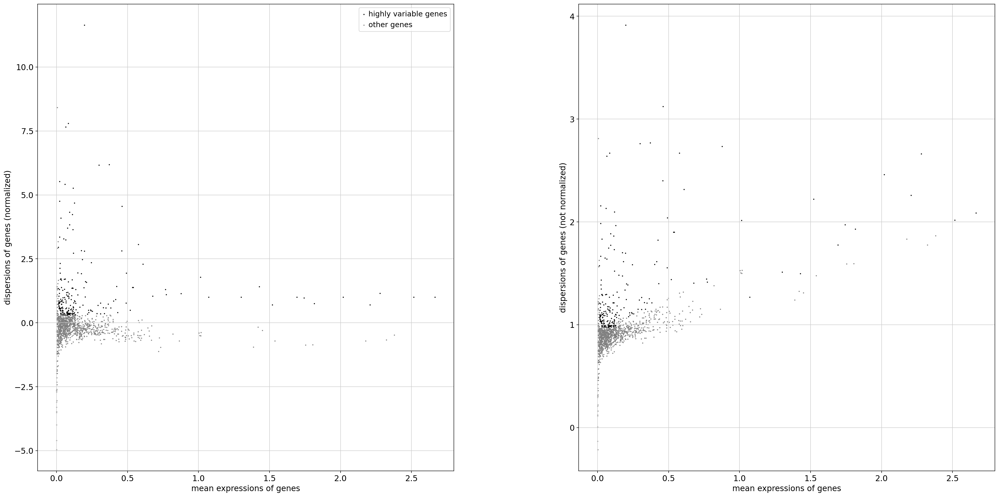

In [45]:
sc.pp.highly_variable_genes(arabi_single_cell_slimmed_to_orthologs, min_mean=0.0125, max_mean=3, min_disp=0.3)
sc.pl.highly_variable_genes(arabi_single_cell_slimmed_to_orthologs)


In [46]:
arabi_single_cell_slimmed_to_orthologs =arabi_single_cell_slimmed_to_orthologs[arabi_single_cell_slimmed_to_orthologs.obs.loc[arabi_single_cell_slimmed_to_orthologs.obs['Cell Cluster Annotation'].isin(types_to_include_in_mapping)].index,:]
arabi_single_cell_slimmed_to_orthologs

View of AnnData object with n_obs × n_vars = 4610 × 1289
    obs: 'Barcode', 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming'
    var: 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Arabidopsis Gene', 'Maize Gene'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors', 'Before Trimming Colors'
    obsm: 'X_pca', 'X_umap', 'Before Trimming X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

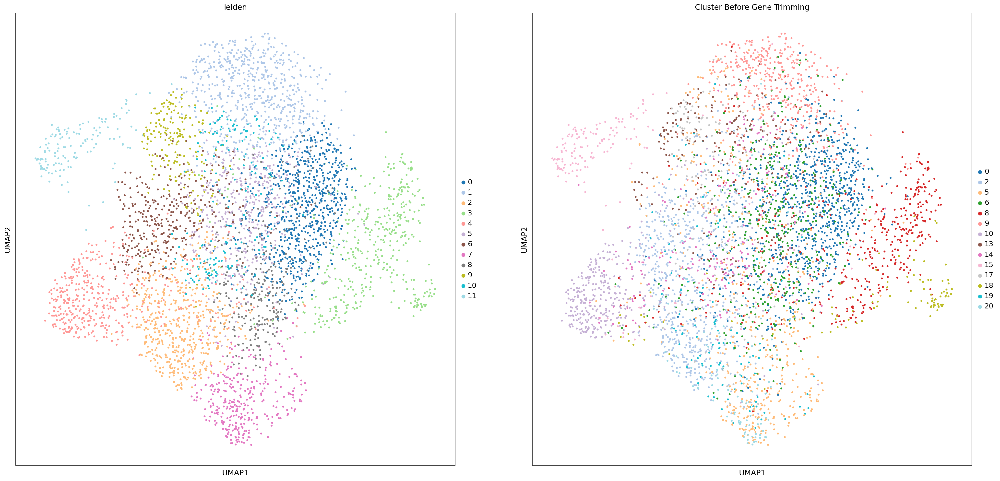

In [47]:
sc.tl.pca(arabi_single_cell_slimmed_to_orthologs, svd_solver='arpack', random_state= 43)
sc.pp.neighbors(arabi_single_cell_slimmed_to_orthologs, n_neighbors=20, n_pcs=50, random_state= 89)
sc.tl.umap(arabi_single_cell_slimmed_to_orthologs, random_state= 334)
sc.tl.leiden(arabi_single_cell_slimmed_to_orthologs, random_state= 887)

sc.pl.umap(arabi_single_cell_slimmed_to_orthologs, color = ['leiden','Cluster Before Gene Trimming'], palette= 'tab20', s=50)

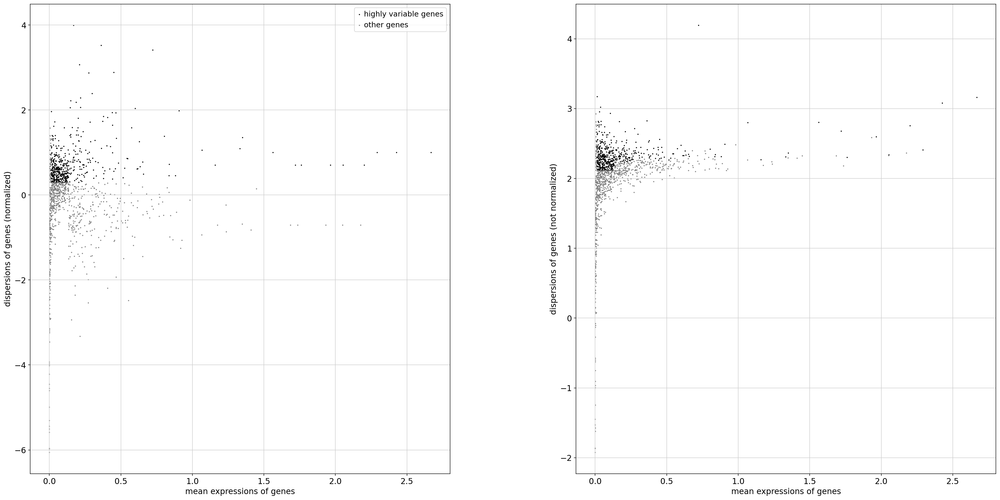

In [48]:
## Previous HVG identification is sufficient 
sc.pp.highly_variable_genes(maize_single_cell_trimmed_to_orthologs, min_mean=0.01, max_mean=3, min_disp=0.3) 
sc.pl.highly_variable_genes(maize_single_cell_trimmed_to_orthologs)


In [49]:
maize_single_cell_trimmed_to_orthologs =maize_single_cell_trimmed_to_orthologs[maize_single_cell_trimmed_to_orthologs.obs.loc[maize_single_cell_trimmed_to_orthologs.obs['Cell Cluster Annotation'].isin(types_to_include_in_mapping)].index,:]
maize_single_cell_trimmed_to_orthologs

View of AnnData object with n_obs × n_vars = 2062 × 1289
    obs: 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming'
    var: 'feature_types', 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Arabidopsis Gene', 'Maize Gene'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors', 'Before Trimming Colors'
    obsm: 'X_pca', 'X_umap', 'Before Trimming X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

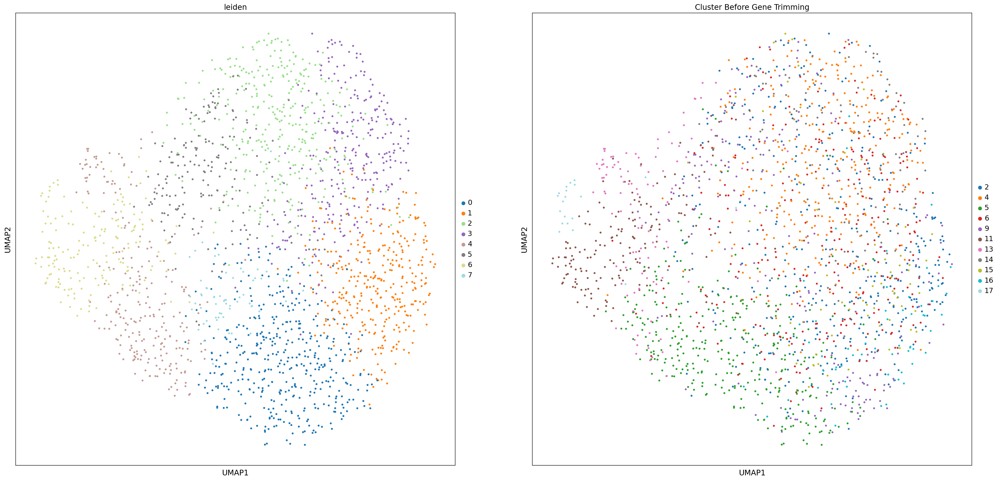

In [50]:
sc.tl.pca(maize_single_cell_trimmed_to_orthologs, svd_solver='arpack', random_state= 43)
sc.pp.neighbors(maize_single_cell_trimmed_to_orthologs, n_neighbors=20, n_pcs=50, random_state= 89)
sc.tl.umap(maize_single_cell_trimmed_to_orthologs, random_state= 334)
sc.tl.leiden(maize_single_cell_trimmed_to_orthologs, random_state= 887)

sc.pl.umap(maize_single_cell_trimmed_to_orthologs, color = ['leiden','Cluster Before Gene Trimming'], palette= 'tab20', s=50)

In [51]:
maize_single_cell_trimmed_to_orthologs.obs['Original Cell Cluster Annotation'] = maize_single_cell_trimmed_to_orthologs.obs['Cell Cluster Annotation']
arabi_single_cell_slimmed_to_orthologs.obs['Original Cell Cluster Annotation'] = arabi_single_cell_slimmed_to_orthologs.obs['Cell Cluster Annotation']

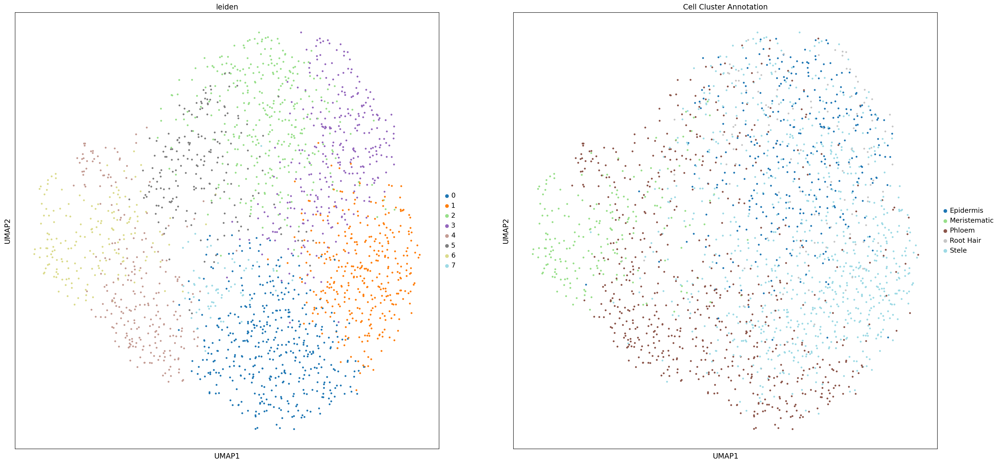

In [52]:
sc.pl.umap(maize_single_cell_trimmed_to_orthologs, color = ['leiden','Cell Cluster Annotation'], palette= 'tab20', s=50)

In [53]:
#### Arabidopsis Reference

# sc.tl.ingest(maize_single_cell_trimmed_to_orthologs, arabi_single_cell_slimmed_to_orthologs, obs='Cell Cluster Annotation')

# maize_single_cell_trimmed_to_orthologs.uns['leiden_colors'] = arabi_single_cell_slimmed_to_orthologs.uns['leiden_colors']  # fix colors

# concatendated_arabi_maize_dataset = arabi_single_cell_slimmed_to_orthologs.concatenate(maize_single_cell_trimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Arabidopsis','Maize'])
# concatendated_arabi_maize_dataset.obs.leiden = concatendated_arabi_maize_dataset.obs.leiden.astype('category')
# concatendated_arabi_maize_dataset.obs.leiden.cat.reorder_categories(arabi_single_cell_slimmed_to_orthologs.obs.leiden.cat.categories, inplace=True)  # fix category ordering
# concatendated_arabi_maize_dataset.uns['leiden_colors'] = arabi_single_cell_slimmed_to_orthologs.uns['leiden_colors'] 
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'leiden'], s= 50)


In [54]:
#sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'Cell Cluster Annotation'], s= 50)


In [55]:
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Original Cell Cluster Annotation'], s= 25)


In [56]:
# subset = concatendated_arabi_maize_dataset[concatendated_arabi_maize_dataset.obs['Original Cell Cluster Annotation'] == 'Stele']
# sc.pl.umap(subset, color=['Species'], s= 25)

In [57]:
import pymn

# pymn.variableGenes(concatendated_arabi_maize_dataset,study_col = 'Species')
# pymn.MetaNeighborUS(concatendated_arabi_maize_dataset,study_col = 'Species',ct_col = 'Original Cell Cluster Annotation')
# g = pymn.plotMetaNeighborUS(concatendated_arabi_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
# #g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_project/Figures/new_data_only_across_species.jpg')

In [58]:
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'leiden'], s= 50)


In [59]:
# ### Maize Reference -- Worse than Arabidopsis Reference

# sc.tl.ingest(arabi_single_cell_slimmed_to_orthologs, maize_single_cell_trimmed_to_orthologs, obs='Cell Cluster Annotation')

# arabi_single_cell_slimmed_to_orthologs.uns['leiden_colors'] = maize_single_cell_trimmed_to_orthologs.uns['leiden_colors']  # fix colors

# concatendated_arabi_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(arabi_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Arabidopsis'])
# concatendated_arabi_maize_dataset.obs.leiden = concatendated_arabi_maize_dataset.obs.leiden.astype('category')
# #concatendated_arabi_maize_dataset.obs.leiden.cat.reorder_categories(maize_single_cell_trimmed_to_orthologs.obs.leiden.cat.categories, inplace=True)  # fix category ordering
# concatendated_arabi_maize_dataset.uns['leiden_colors'] = maize_single_cell_trimmed_to_orthologs.uns['leiden_colors'] 
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'Cell Cluster Annotation'], s= 50)

In [60]:
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'Original Cell Cluster Annotation'], s= 50)

In [61]:
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species'], s= 25)


In [62]:
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Original Cell Cluster Annotation'], s= 25)


In [63]:
# subset = concatendated_arabi_maize_dataset[concatendated_arabi_maize_dataset.obs['Original Cell Cluster Annotation'] == 'Stele']
# sc.pl.umap(subset, color=['Species'], s= 25)

In [64]:
# import pymn

# pymn.variableGenes(concatendated_arabi_maize_dataset,study_col = 'Species')
# pymn.MetaNeighborUS(concatendated_arabi_maize_dataset,study_col = 'Species',ct_col = 'Original Cell Cluster Annotation')
# g = pymn.plotMetaNeighborUS(concatendated_arabi_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
# #g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_project/Figures/new_data_only_across_species.jpg')

In [65]:

## BBKNN -- Sucks
# sc.tl.pca(concatendated_arabi_maize_dataset)
# sc.external.pp.bbknn(concatendated_arabi_maize_dataset, batch_key='Species')
# sc.tl.umap(concatendated_arabi_maize_dataset)
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'leiden'], s= 50)

In [66]:
# concatendated_arabi_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(arabi_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Arabidopsis'])


In [67]:
## Scanorama Tutorial Way -- Doesn't work
# concatendated_arabi_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(arabi_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Arabidopsis'])

# adatas = [maize_single_cell_trimmed_to_orthologs,arabi_single_cell_slimmed_to_orthologs]
# scanorama.integrate_scanpy(adatas, dimred = 50)
# scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]

# # make into one matrix.
# all_s = np.concatenate(scanorama_int)
# print(all_s.shape)

# # add to the AnnData object
# concatendated_arabi_maize_dataset.obsm["Scanorama"] = all_s
# sc.pp.neighbors(concatendated_arabi_maize_dataset, n_pcs =50, use_rep = "Scanorama")
# sc.tl.umap(concatendated_arabi_maize_dataset)
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'leiden'], s= 50)

In [68]:
# ## External Scanpy Tutorial Docs Page Way 

# concatendated_arabi_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(arabi_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Arabidopsis'])

# sc.pp.highly_variable_genes(concatendated_arabi_maize_dataset, min_mean=0.01, max_mean=3, min_disp=0.3) 

# #sc.tl.pca(concatendated_arabi_maize_dataset, svd_solver='arpack', random_state= 567)
# sc.external.pp.scanorama_integrate(concatendated_arabi_maize_dataset, 'Species')

# sc.pp.neighbors(concatendated_arabi_maize_dataset, n_neighbors=20, n_pcs=50, random_state= 22, use_rep= 'X_scanorama' )
# sc.tl.umap(concatendated_arabi_maize_dataset, random_state= 632)
# sc.tl.leiden(concatendated_arabi_maize_dataset, random_state= 344)

# sc.pl.umap(concatendated_arabi_maize_dataset, color = ['Species','Cluster Before Gene Trimming'], palette= 'tab20', s=50)


In [69]:
# maize_subset = concatendated_arabi_maize_dataset[concatendated_arabi_maize_dataset.obs['Species'] == 'Maize']
# arabidopsis_subset = concatendated_arabi_maize_dataset[concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis']
# sc.pl.umap(maize_subset, color = 'Cluster Before Gene Trimming', palette= 'tab20', s=50)

In [70]:
# sc.pl.umap(arabidopsis_subset, color = 'Cluster Before Gene Trimming', palette= 'tab20', s=50)

In [71]:
concatendated_arabi_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(arabi_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Arabidopsis'])


/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [72]:
concatendated_arabi_maize_dataset

AnnData object with n_obs × n_vars = 6672 × 1289
    obs: 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming', 'Original Cell Cluster Annotation', 'Barcode', 'Species'
    var: 'In CoCoCoNet', 'Arabidopsis Gene', 'Maize Gene', 'highly_variable-Arabidopsis', 'means-Arabidopsis', 'dispersions-Arabidopsis', 'dispersions_norm-Arabidopsis', 'feature_types-Maize', 'highly_variable-Maize', 'means-Maize', 'dispersions-Maize', 'dispersions_norm-Maize'
    obsm: 'X_pca', 'X_umap', 'Before Trimming X_umap'

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


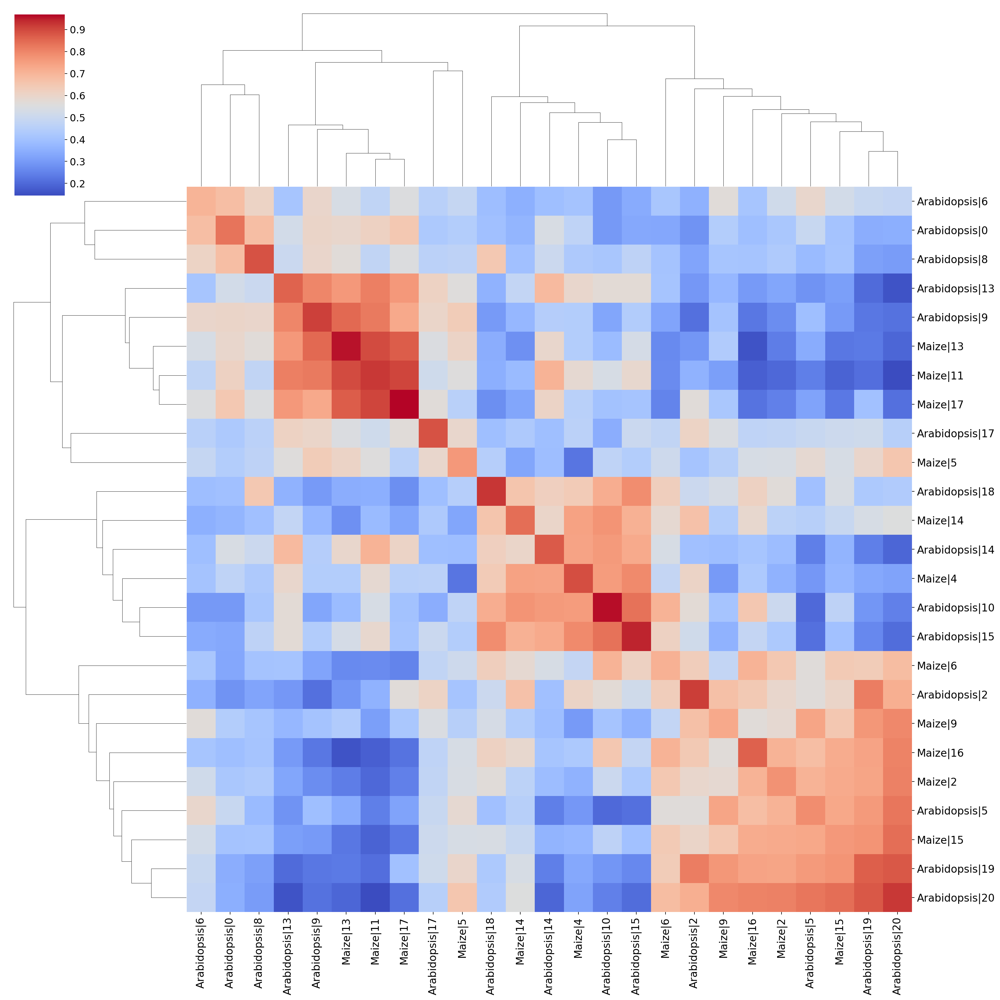

In [73]:
import pymn

pymn.variableGenes(concatendated_arabi_maize_dataset,study_col = 'Species')
pymn.MetaNeighborUS(concatendated_arabi_maize_dataset,study_col = 'Species',ct_col = 'Cluster Before Gene Trimming')
g = pymn.plotMetaNeighborUS(concatendated_arabi_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
#g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_project/Figures/new_data_only_across_species.jpg')

In [74]:
concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'] = concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming']

concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['17','2','5','19','20']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '17+2+5+19+20'
#concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['19','20']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '19+20'
concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['15','18']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '15+18'
concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['14','10']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '14+10'
concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['8','0']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '8+0'
concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['13','9']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '13+9'

concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['16','6']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Maize')] = '16+6'
concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['13','11','17']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Maize')] = '13+11+17'

concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['15','2']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Maize')] = '15+2'


/tmp/ipykernel_951308/739329683.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['17','2','5','19','20']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '17+2+5+19+20'
/tmp/ipykernel_951308/739329683.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['15','18']))&(concatendated_arabi_maize_

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


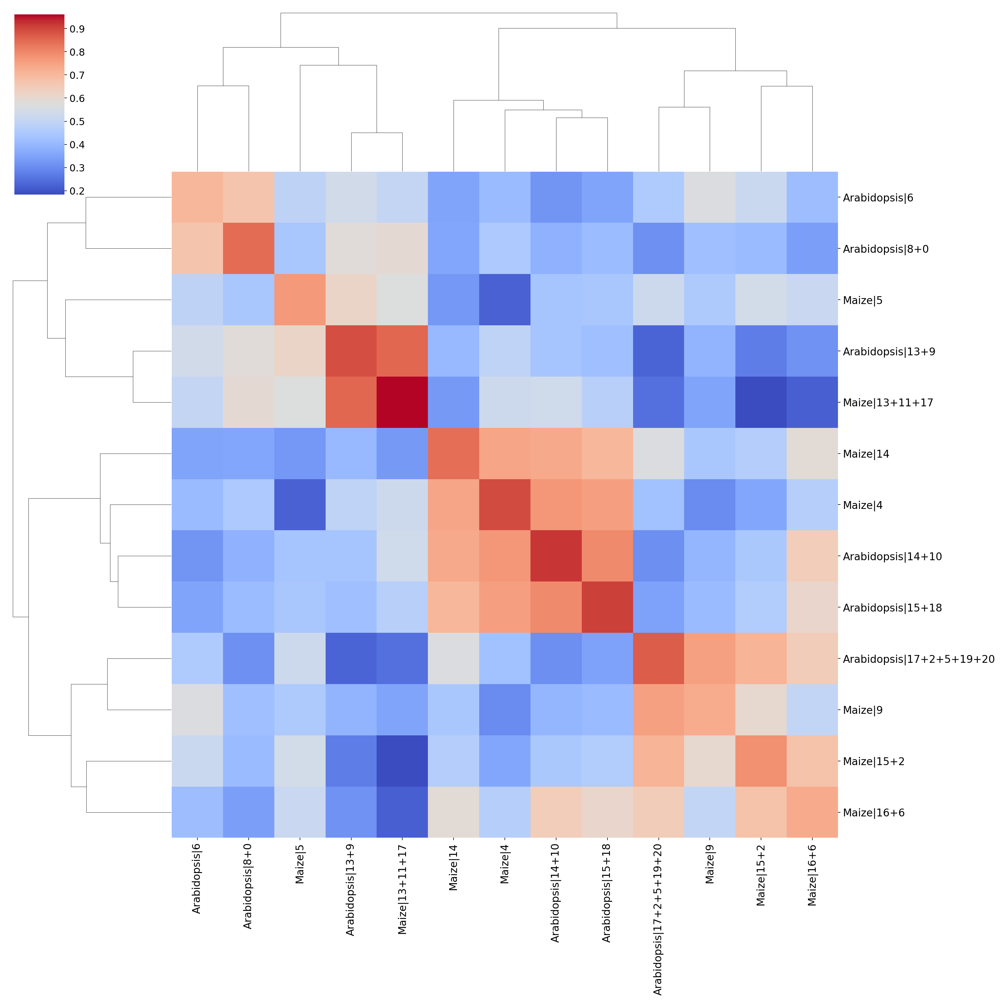

In [75]:
pymn.variableGenes(concatendated_arabi_maize_dataset,study_col = 'Species')
pymn.MetaNeighborUS(concatendated_arabi_maize_dataset,study_col = 'Species',ct_col = 'Combined_Pre_trimming_clusters')
g = pymn.plotMetaNeighborUS(concatendated_arabi_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
#g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_project/Figures/new_data_only_across_species.jpg')

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


[[0.         0.98157129]
 [0.         0.        ]]
Processing datasets Maize <=> Arabidopsis


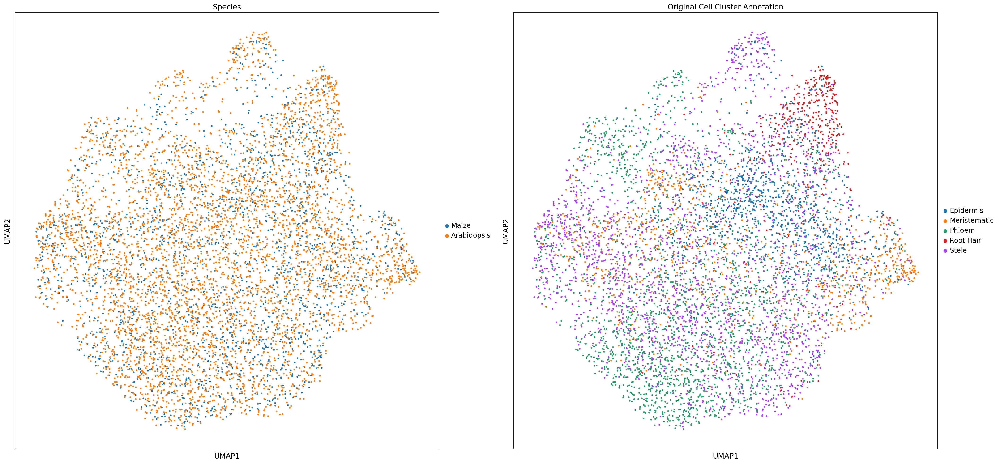

In [76]:
### Scanorama as in Validating By cutting in half 

import scanorama
concatendated_arabi_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(arabi_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Arabidopsis'])
#sc.tl.pca(concatenated_alpha_beta_database, svd_solver='arpack', )

sc.external.pp.scanorama_integrate(concatendated_arabi_maize_dataset,'Species')
sc.pp.neighbors(concatendated_arabi_maize_dataset, n_neighbors = 10, n_pcs = 40, use_rep= 'X_scanorama', random_state = 2204)
sc.tl.umap(concatendated_arabi_maize_dataset, random_state= 243)
sc.pl.umap(concatendated_arabi_maize_dataset, color= ['Species', 'Original Cell Cluster Annotation'], s = 40,)

In [77]:
clustering_results = pd.DataFrame(index = concatendated_arabi_maize_dataset.obs.index)
clustering_results

""
AAACCCAAGAGCAGCT-1-Maize
AAACCCAAGCACCGTC-1-Maize
AAACCCAGTGATCATC-1-Maize
AAACCCATCAGACCCG-1-Maize
AAACGAACAGATAAAC-1-Maize
...
TTTGTCACAGGGCATA-Arabidopsis
TTTGTCATCAAGGCTT-Arabidopsis
TTTGTCATCCCACTTG-Arabidopsis
TTTGTCATCCTGCCAT-Arabidopsis


In [78]:
for current_run in np.arange(100):
    cells_to_keep = concatendated_arabi_maize_dataset.obs.sample(frac = .8).index
    subsampled_anndata_concat = concatendated_arabi_maize_dataset[cells_to_keep,:]
    sc.pp.neighbors(subsampled_anndata_concat, n_neighbors = 10, n_pcs = 40, use_rep= 'X_scanorama', )
    sc.tl.umap(subsampled_anndata_concat,)
    sc.tl.leiden(subsampled_anndata_concat, resolution = .7)
    clustering_results = clustering_results.merge(right = subsampled_anndata_concat.obs[['leiden']], right_index= True, left_index= True, how = 'left')
    clustering_results = clustering_results.rename(columns = {'leiden':current_run})

In [79]:
clustering_results = clustering_results.replace(np.nan,None).astype('Int64')
clustering_results

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
AAACCCAAGAGCAGCT-1-Maize,6,6,6,5,5,<NA>,6,6,<NA>,6,...,6,<NA>,6,6,<NA>,7,6,6,4,7
AAACCCAAGCACCGTC-1-Maize,<NA>,0,3,2,2,3,<NA>,3,4,2,...,3,3,3,4,4,4,4,<NA>,3,6
AAACCCAGTGATCATC-1-Maize,6,6,6,5,5,<NA>,<NA>,6,7,6,...,<NA>,7,<NA>,6,6,<NA>,<NA>,6,4,7
AAACCCATCAGACCCG-1-Maize,2,0,3,8,7,<NA>,7,3,4,2,...,8,3,3,8,7,8,8,4,3,<NA>
AAACGAACAGATAAAC-1-Maize,<NA>,4,4,3,<NA>,2,3,4,3,<NA>,...,2,2,<NA>,3,1,1,3,3,<NA>,<NA>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACAGGGCATA-Arabidopsis,5,5,5,<NA>,4,5,5,5,6,<NA>,...,4,5,7,5,5,3,5,5,5,4
TTTGTCATCAAGGCTT-Arabidopsis,0,1,0,0,0,1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
TTTGTCATCCCACTTG-Arabidopsis,6,6,4,<NA>,5,6,6,6,7,6,...,<NA>,7,6,6,6,7,6,6,<NA>,7
TTTGTCATCCTGCCAT-Arabidopsis,4,4,4,3,1,2,3,4,3,3,...,2,2,<NA>,3,1,1,3,<NA>,2,3


In [80]:
distance_matrix_results = pd.DataFrame(columns = clustering_results.index,index = clustering_results.index)
distance_matrix_results

,AAACCCAAGAGCAGCT-1-Maize,AAACCCAAGCACCGTC-1-Maize,AAACCCAGTGATCATC-1-Maize,AAACCCATCAGACCCG-1-Maize,AAACGAACAGATAAAC-1-Maize,AAACGAACATCGTGCG-1-Maize,AAACGAATCGAACACT-1-Maize,AAACGCTCAGGCACTC-1-Maize,AAACGCTGTGTTCGAT-1-Maize,AAAGAACAGGAAAGAC-1-Maize,...,TTTGGTTGTATCAGTC-Arabidopsis,TTTGTCAAGGAATCGC-Arabidopsis,TTTGTCAAGGTGCACA-Arabidopsis,TTTGTCAAGTGAACAT-Arabidopsis,TTTGTCAAGTTTGCGT-Arabidopsis,TTTGTCACAGGGCATA-Arabidopsis,TTTGTCATCAAGGCTT-Arabidopsis,TTTGTCATCCCACTTG-Arabidopsis,TTTGTCATCCTGCCAT-Arabidopsis,TTTGTCATCTCTGCTG-Arabidopsis
AAACCCAAGAGCAGCT-1-Maize,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACCCAAGCACCGTC-1-Maize,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACCCAGTGATCATC-1-Maize,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACCCATCAGACCCG-1-Maize,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACGAACAGATAAAC-1-Maize,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACAGGGCATA-Arabidopsis,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TTTGTCATCAAGGCTT-Arabidopsis,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TTTGTCATCCCACTTG-Arabidopsis,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TTTGTCATCCTGCCAT-Arabidopsis,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [81]:

pd.options.mode.chained_assignment = None  # default='warn'

In [82]:
cocluster_results_list_to_make_df = []

for gene_id,gene_number in zip(distance_matrix_results.index,np.arange(6672)):
    print(gene_number)
    current_row = clustering_results.loc[gene_id]
    equality_df = clustering_results.T.eq(current_row, axis = 0)
    current_cocluster_results = (equality_df.sum()/equality_df.count()).tolist()
    cocluster_results_list_to_make_df.append(current_cocluster_results)

distance_matrix_results = pd.DataFrame(columns = clustering_results.index,index = clustering_results.index, data = cocluster_results_list_to_make_df)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

KeyboardInterrupt: 

In [ ]:
np.fill_diagonal(distance_matrix_results.values,0)
distance_matrix_results

,AAACCCAAGAGCAGCT-1-Maize,AAACCCAAGCACCGTC-1-Maize,AAACCCAGTGATCATC-1-Maize,AAACCCATCAGACCCG-1-Maize,AAACGAACAGATAAAC-1-Maize,AAACGAACATCGTGCG-1-Maize,AAACGAATCGAACACT-1-Maize,AAACGCTCAGGCACTC-1-Maize,AAACGCTGTGTTCGAT-1-Maize,AAAGAACAGGAAAGAC-1-Maize,...,TTTGGTTGTATCAGTC-Arabidopsis,TTTGTCAAGGAATCGC-Arabidopsis,TTTGTCAAGGTGCACA-Arabidopsis,TTTGTCAAGTGAACAT-Arabidopsis,TTTGTCAAGTTTGCGT-Arabidopsis,TTTGTCACAGGGCATA-Arabidopsis,TTTGTCATCAAGGCTT-Arabidopsis,TTTGTCATCCCACTTG-Arabidopsis,TTTGTCATCCTGCCAT-Arabidopsis,TTTGTCATCTCTGCTG-Arabidopsis
AAACCCAAGAGCAGCT-1-Maize,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.280000,0.245614,0.0,...,0.148148,0.000000,0.0,0.166667,0.000000,0.0,0.000000,0.960784,0.000000,0.000000
AAACCCAAGCACCGTC-1-Maize,0.000000,0.000000,0.000000,0.569231,0.000000,0.718750,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.0,0.000000,0.967213,0.0,0.000000,0.000000,0.000000,0.000000
AAACCCAGTGATCATC-1-Maize,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.321429,0.293103,0.0,...,0.174603,0.000000,0.0,0.196721,0.000000,0.0,0.000000,0.961538,0.000000,0.000000
AAACCCATCAGACCCG-1-Maize,0.000000,0.569231,0.000000,0.000000,0.000000,0.358209,0.000000,0.078125,0.000000,0.0,...,0.030769,0.000000,0.0,0.074627,0.522388,0.0,0.000000,0.000000,0.000000,0.000000
AAACGAACAGATAAAC-1-Maize,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.035714,0.000000,0.0,...,0.063492,0.886792,0.0,0.086207,0.000000,0.0,0.000000,0.054545,1.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACAGGGCATA-Arabidopsis,0.000000,0.000000,0.000000,0.000000,0.000000,0.217391,0.000000,0.000000,0.750000,1.0,...,0.000000,0.000000,0.0,0.000000,0.015625,0.0,0.000000,0.000000,0.000000,0.000000
TTTGTCATCAAGGCTT-Arabidopsis,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.637681,0.015625,0.000000,0.0,...,0.000000,0.078125,0.0,0.015152,0.000000,0.0,0.000000,0.000000,0.000000,0.945946
TTTGTCATCCCACTTG-Arabidopsis,0.960784,0.000000,0.961538,0.000000,0.054545,0.000000,0.000000,0.240000,0.258621,0.0,...,0.145455,0.040816,0.0,0.145455,0.000000,0.0,0.000000,0.000000,0.046154,0.000000
TTTGTCATCCTGCCAT-Arabidopsis,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.047619,0.000000,0.0,...,0.072464,0.859375,0.0,0.086957,0.000000,0.0,0.000000,0.046154,0.000000,0.000000


In [ ]:
import sklearn
sklearn.metrics.silhouette_score(distance_matrix_results,concatendated_arabi_maize_dataset.obs['Original Cell Cluster Annotation'], metric = 'precomputed')

-0.7883894357702455

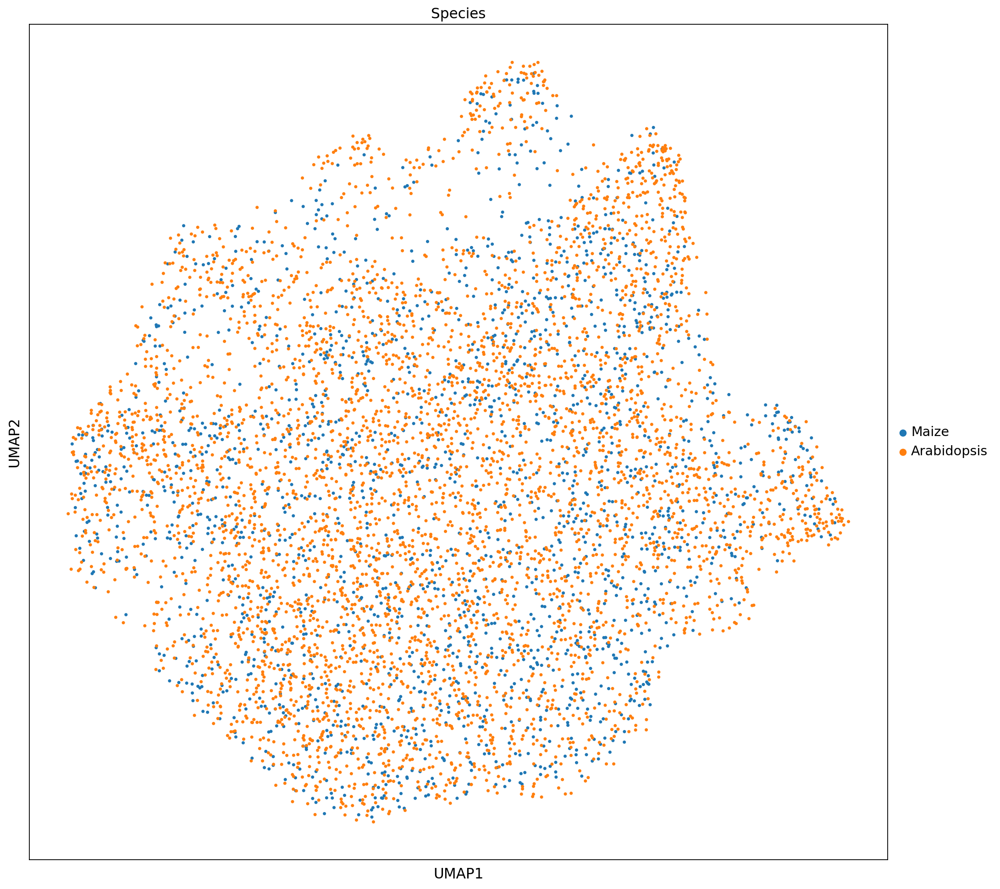

In [ ]:
sc.pl.umap(concatendated_arabi_maize_dataset, color= ['Species', ], s = 40,)

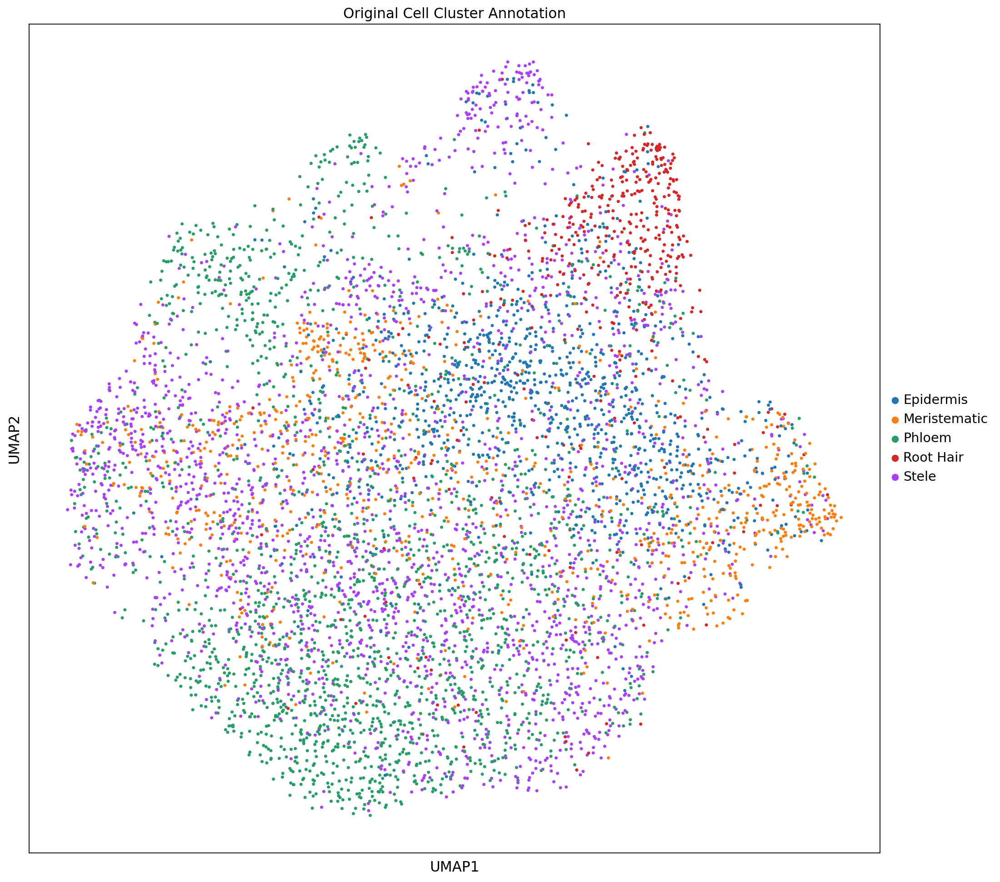

In [ ]:
sc.pl.umap(concatendated_arabi_maize_dataset, color= ['Original Cell Cluster Annotation'], s = 40,)